# Plan 0 old-geneset DR suite diagnosis (april2_2026)

Companion analysis notebook for the geneset-filtered Plan 0 DR run.

Goals:
- verify completion status across methods / K / seeds
- summarize stability diagnostics from cached replicate artifacts
- compare K behavior to support downstream latent-dimension choice

This notebook is designed for experiments generated by:
- `scripts/comprehensive_run/run_plan0_old_geneset_dr_suite.sh`


In [1]:
from __future__ import annotations

from pathlib import Path
import json

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_context("talk")
plt.rcParams["figure.figsize"] = (8, 5)


In [2]:
# ---- set / auto-discover experiment ----
EXPERIMENTS_ROOT = Path("/home/minhang/mds_project/sc_classification/experiments")
EXPLICIT_EXP_DIR = Path(
    "/home/minhang/mds_project/sc_classification/experiments/20260401_023024_plan0_k_sweep_60_none_all_filtered_8f5363e0"
)

if EXPLICIT_EXP_DIR.exists():
    EXP_DIR = EXPLICIT_EXP_DIR
else:
    candidates = sorted(EXPERIMENTS_ROOT.glob("*_plan0_k_sweep_*_all_filtered_*"))
    if not candidates:
        raise FileNotFoundError("No matching all_filtered plan0 experiments found.")
    EXP_DIR = candidates[-1]

PLAN0_DIR = EXP_DIR / "analysis" / "plan0"
STABILITY_DIR = PLAN0_DIR / "stability"
PREPROCESSED = EXP_DIR / "preprocessing" / "adata_processed.h5ad"

print("EXP_DIR:", EXP_DIR)
print("PLAN0_DIR exists:", PLAN0_DIR.exists())
print("STABILITY_DIR exists:", STABILITY_DIR.exists())
print("PREPROCESSED exists:", PREPROCESSED.exists())


EXP_DIR: /home/minhang/mds_project/sc_classification/experiments/20260401_023024_plan0_k_sweep_60_none_all_filtered_8f5363e0
PLAN0_DIR exists: True
STABILITY_DIR exists: True
PREPROCESSED exists: True


In [3]:
# ---- run metadata / gene-panel sanity ----
config_path = PLAN0_DIR / "config.json"
gmt_info_path = PLAN0_DIR / "gmt_restriction.json"

cfg = json.loads(config_path.read_text()) if config_path.exists() else {}
gmt_info = json.loads(gmt_info_path.read_text()) if gmt_info_path.exists() else {}

print("config path:", config_path)
print("gmt info path:", gmt_info_path)
print("\nPlan0 methods:", cfg.get("plan0", {}).get("methods"))
print("Plan0 Ks:", cfg.get("plan0", {}).get("ks"))
print("Plan0 seeds:", cfg.get("plan0", {}).get("seeds"))
print("Reference selection:", cfg.get("plan0", {}).get("reference_selection_method"))
print("\nGMT restriction info:")
print(json.dumps(gmt_info, indent=2))


config path: /home/minhang/mds_project/sc_classification/experiments/20260401_023024_plan0_k_sweep_60_none_all_filtered_8f5363e0/analysis/plan0/config.json
gmt info path: /home/minhang/mds_project/sc_classification/experiments/20260401_023024_plan0_k_sweep_60_none_all_filtered_8f5363e0/analysis/plan0/gmt_restriction.json

Plan0 methods: ['fa', 'factosig', 'pca', 'nmf', 'cnmf']
Plan0 Ks: [20, 40, 60]
Plan0 seeds: [1, 2, 3, 4, 5]
Reference selection: all_filtered

GMT restriction info:
{
  "gmt_path": "/home/minhang/mds_project/sc_classification/scripts/knowledge_driven_embedding/older_geneset/genesets_v1.gmt",
  "case_sensitive": false,
  "n_genes_in_gmt_union": 3324,
  "n_genes_before_restrict": 335386,
  "n_genes_after_restrict": 3270
}


In [4]:
# ---- completion audit: method x K x seed ----
methods = ["fa", "factosig", "pca", "nmf"]
ks = [20, 40, 60]
seeds = [1, 2, 3, 4, 5]

rows = []
for m in methods:
    for k in ks:
        rep_dir = STABILITY_DIR / m / f"k_{k}" / "replicates"
        present = []
        for s in seeds:
            p = rep_dir / f"seed_{s}"
            ok = (p / "scores.npy").exists() and (p / "loadings.npy").exists() and (p / "extras.json").exists()
            if ok:
                present.append(s)
        rows.append(
            {
                "method": m,
                "k": k,
                "n_replicates_present": len(present),
                "replicates_present": present,
                "complete_expected_5": len(present) == len(seeds),
                "pairwise_summary_exists": (STABILITY_DIR / m / f"k_{k}" / "pairwise_stability_summary.json").exists(),
            }
        )

completion_df = pd.DataFrame(rows).sort_values(["method", "k"]).reset_index(drop=True)
completion_df


,method,k,n_replicates_present,replicates_present,complete_expected_5,pairwise_summary_exists
0,fa,20,5,"[1, 2, 3, 4, 5]",True,True
1,fa,40,5,"[1, 2, 3, 4, 5]",True,True
2,fa,60,5,"[1, 2, 3, 4, 5]",True,True
3,factosig,20,5,"[1, 2, 3, 4, 5]",True,True
4,factosig,40,5,"[1, 2, 3, 4, 5]",True,True
5,factosig,60,5,"[1, 2, 3, 4, 5]",True,True
6,nmf,20,5,"[1, 2, 3, 4, 5]",True,True
7,nmf,40,0,[],False,False
8,nmf,60,0,[],False,False
9,pca,20,5,"[1, 2, 3, 4, 5]",True,True


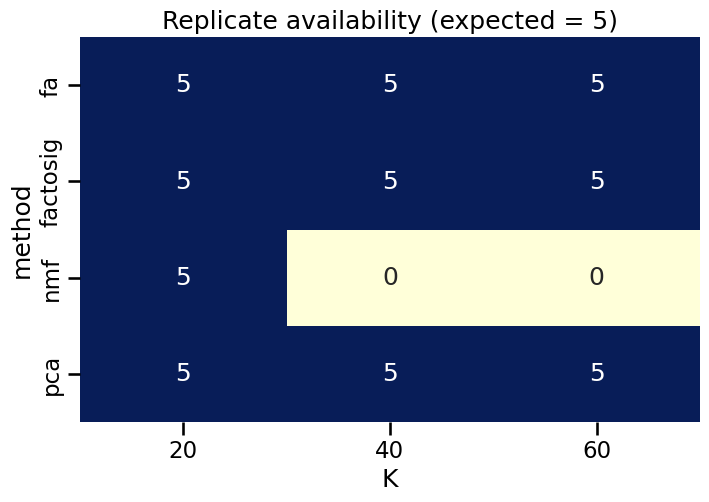

Missing / incomplete method-K blocks:


,method,k,n_replicates_present,replicates_present
7,nmf,40,0,[]
8,nmf,60,0,[]


In [5]:
# quick visual status matrix
status_mat = completion_df.pivot(index="method", columns="k", values="n_replicates_present")

ax = sns.heatmap(status_mat, annot=True, fmt="d", cmap="YlGnBu", cbar=False)
ax.set_title("Replicate availability (expected = 5)")
ax.set_xlabel("K")
ax.set_ylabel("method")
plt.show()

missing = completion_df[~completion_df["complete_expected_5"]].copy()
if len(missing):
    print("Missing / incomplete method-K blocks:")
    display(missing[["method", "k", "n_replicates_present", "replicates_present"]])
else:
    print("All method-K blocks have complete replicate caches.")


In [6]:
# ---- build plan0 K diagnostics table from cached artifacts ----
def _load_json(p: Path):
    if not p.exists():
        return None
    return json.loads(p.read_text())

records = []
for m in methods:
    for k in ks:
        mdir = STABILITY_DIR / m / f"k_{k}"
        pair = _load_json(mdir / "pairwise_stability_summary.json") or {}
        pairs = pair.get("pairs", [])

        best_a_medians = [x.get("best_a_median") for x in pairs if x.get("best_a_median") is not None]
        best_a_means = [x.get("best_a_mean") for x in pairs if x.get("best_a_mean") is not None]
        frac_lt_03 = [x.get("best_a_frac_lt_0p3") for x in pairs if x.get("best_a_frac_lt_0p3") is not None]

        cons = _load_json(mdir / "consensus_cache" / "consensus_metrics.json") or {}

        # variance/reconstruction proxy from seed1 extras where present
        extras = _load_json(mdir / "replicates" / "seed_1" / "extras.json") or {}
        variance_proxy = None
        if m == "pca":
            # sklearn PCA wrapper stores explained variance ratio in uns->variance_ratio
            vr = extras.get("variance_ratio", None)
            if isinstance(vr, list) and len(vr):
                variance_proxy = float(np.sum(vr))

        records.append(
            {
                "method": m,
                "k": k,
                "n_pairwise_pairs": len(pairs),
                "stability_best_a_median_mean_over_pairs": float(np.mean(best_a_medians)) if best_a_medians else np.nan,
                "stability_best_a_mean_mean_over_pairs": float(np.mean(best_a_means)) if best_a_means else np.nan,
                "stability_frac_lt_0p3_mean_over_pairs": float(np.mean(frac_lt_03)) if frac_lt_03 else np.nan,
                "consensus_silhouette": cons.get("silhouette", np.nan),
                "consensus_kept_n": cons.get("kept_n", np.nan),
                "variance_proxy": variance_proxy,
            }
        )

diag_df = pd.DataFrame(records).sort_values(["method", "k"]).reset_index(drop=True)
diag_df


,method,k,n_pairwise_pairs,stability_best_a_median_mean_over_pairs,stability_best_a_mean_mean_over_pairs,stability_frac_lt_0p3_mean_over_pairs,consensus_silhouette,consensus_kept_n,variance_proxy
0,fa,20,4,0.999924,0.987738,0.000000,0.936444,100.0,None
1,fa,40,4,0.997297,0.900621,0.000000,0.718630,200.0,None
2,fa,60,4,0.953082,0.813431,0.033333,0.623471,300.0,None
3,factosig,20,4,0.998522,0.968584,0.000000,0.873126,100.0,None
4,factosig,40,4,0.999850,0.984532,0.000000,0.933794,200.0,None
5,factosig,60,4,0.993811,0.956556,0.004167,0.782327,299.0,None
6,nmf,20,4,0.999969,0.999885,0.000000,NaN,NaN,None
7,nmf,40,0,NaN,NaN,NaN,NaN,NaN,None
8,nmf,60,0,NaN,NaN,NaN,NaN,NaN,None
9,pca,20,4,1.000000,0.999719,0.000000,NaN,NaN,None


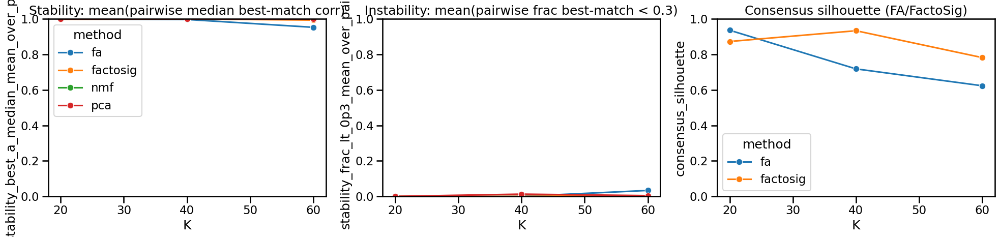

In [7]:
# ---- plots for K selection ----
fig, axes = plt.subplots(1, 3, figsize=(20, 5))

sns.lineplot(
    data=diag_df,
    x="k",
    y="stability_best_a_median_mean_over_pairs",
    hue="method",
    marker="o",
    ax=axes[0],
)
axes[0].set_title("Stability: mean(pairwise median best-match corr)")
axes[0].set_ylim(0, 1)

sns.lineplot(
    data=diag_df,
    x="k",
    y="stability_frac_lt_0p3_mean_over_pairs",
    hue="method",
    marker="o",
    ax=axes[1],
    legend=False,
)
axes[1].set_title("Instability: mean(pairwise frac best-match < 0.3)")
axes[1].set_ylim(0, 1)

sns.lineplot(
    data=diag_df[diag_df["method"].isin(["fa", "factosig"])],
    x="k",
    y="consensus_silhouette",
    hue="method",
    marker="o",
    ax=axes[2],
)
axes[2].set_title("Consensus silhouette (FA/FactoSig)")
axes[2].set_ylim(0, 1)

for ax in axes:
    ax.set_xlabel("K")

plt.tight_layout()
plt.show()


In [8]:
# ---- concise recommendation table scaffold ----
# Fill / revise this once run is complete and you inspect the curves above.

recommendation = (
    diag_df[[
        "method",
        "k",
        "stability_best_a_median_mean_over_pairs",
        "stability_frac_lt_0p3_mean_over_pairs",
        "consensus_silhouette",
        "variance_proxy",
    ]]
    .sort_values(["method", "k"])
    .reset_index(drop=True)
)

recommendation


,method,k,stability_best_a_median_mean_over_pairs,stability_frac_lt_0p3_mean_over_pairs,consensus_silhouette,variance_proxy
0,fa,20,0.999924,0.000000,0.936444,None
1,fa,40,0.997297,0.000000,0.718630,None
2,fa,60,0.953082,0.033333,0.623471,None
3,factosig,20,0.998522,0.000000,0.873126,None
4,factosig,40,0.999850,0.000000,0.933794,None
5,factosig,60,0.993811,0.004167,0.782327,None
6,nmf,20,0.999969,0.000000,NaN,None
7,nmf,40,NaN,NaN,NaN,None
8,nmf,60,NaN,NaN,NaN,None
9,pca,20,1.000000,0.000000,NaN,None


In [9]:
# Optional: build canonical k_selection_summary.csv from caches (if desired)
# import subprocess
# cmd = [
#     "python",
#     "/home/minhang/mds_project/sc_classification/scripts/comprehensive_run/build_plan0_k_selection_summary.py",
#     "--experiment-dir",
#     str(EXP_DIR),
# ]
# print("Running:", " ".join(cmd))
# subprocess.run(cmd, check=True)
# display(pd.read_csv(EXP_DIR / "analysis" / "plan0" / "k_selection_summary.csv"))


## UMAP on existing latent DR spaces

Below we build a neighborhood graph directly on each existing latent representation and run UMAP.

- We use MRD-only cells from the Plan 0 preprocessed dataset (this run was configured with `timepoint_filter=MRD`).
- We color by:
  - `CN.label` (cancer vs normal)
  - `predicted.annotation` (cell type labels)


In [10]:
import scanpy as sc
import anndata as ad

# Load obs metadata from preprocessed Plan 0 artifact.
adata_meta = sc.read_h5ad(PREPROCESSED)
obs_meta = adata_meta.obs.copy()

print("meta shape:", adata_meta.shape)
print("obs columns include CN.label:", "CN.label" in obs_meta.columns)
print("obs columns include predicted.annotation:", "predicted.annotation" in obs_meta.columns)

if "timepoint_type" in obs_meta.columns:
    print("timepoint_type counts:")
    print(obs_meta["timepoint_type"].value_counts(dropna=False).head(10))
elif "Time" in obs_meta.columns:
    print("Time counts (raw):")
    print(obs_meta["Time"].value_counts(dropna=False).head(10))
else:
    print("No timepoint_type/Time column found in obs.")


meta shape: (60118, 3233)
obs columns include CN.label: True
obs columns include predicted.annotation: True
timepoint_type counts:
timepoint_type
MRD    60118
Name: count, dtype: int64


In [11]:
# Helpers to load latent scores and run UMAP on latent space

def _scores_path(method: str, k: int, seed: int = 1) -> Path:
    return STABILITY_DIR / method / f"k_{k}" / "replicates" / f"seed_{seed}" / "scores.npy"


def plot_umap_from_latent(
    method: str,
    k: int,
    seed: int = 1,
    n_neighbors: int = 15,
    figsize: tuple[float, float] = (24.0, 6.5),
):
    sp = _scores_path(method, k, seed)
    if not sp.exists():
        raise FileNotFoundError(f"Missing scores file: {sp}")

    scores = np.load(sp)
    if scores.shape[0] != obs_meta.shape[0]:
        raise ValueError(
            f"Cell count mismatch for {method} k={k}: "
            f"scores={scores.shape[0]}, obs={obs_meta.shape[0]}"
        )

    ad_lat = ad.AnnData(X=scores, obs=obs_meta.copy())
    sc.pp.neighbors(ad_lat, n_neighbors=n_neighbors, use_rep="X")
    sc.tl.umap(ad_lat, random_state=0)

    # Wide canvas + constrained_layout: right-margin legends reserve space instead of
    # crushing axes (tight_layout() tends to over-compress 1×3 embedding grids).
    fig, axes = plt.subplots(
        1,
        3,
        figsize=figsize,
        constrained_layout=True,
        gridspec_kw={"wspace": 0.22},
    )
    sc.pl.umap(
        ad_lat,
        color="CN.label",
        ax=axes[0],
        show=False,
        title=f"{method.upper()} k={k} (seed={seed}) | CN.label",
    )
    sc.pl.umap(
        ad_lat,
        color="predicted.annotation",
        ax=axes[1],
        show=False,
        title=f"{method.upper()} k={k} (seed={seed}) | predicted.annotation",
        legend_loc="right margin",
    )
    sc.pl.umap(
        ad_lat,
        color="patient",
        ax=axes[2],
        show=False,
        title=f"{method.upper()} k={k} (seed={seed}) | patient",
        legend_loc="right margin",
    )
    for ax in axes:
        ax.set_aspect("equal", adjustable="datalim")
    plt.show()

    return ad_lat


/home/minhang/miniconda3/envs/sc-classification-rapids-py311/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


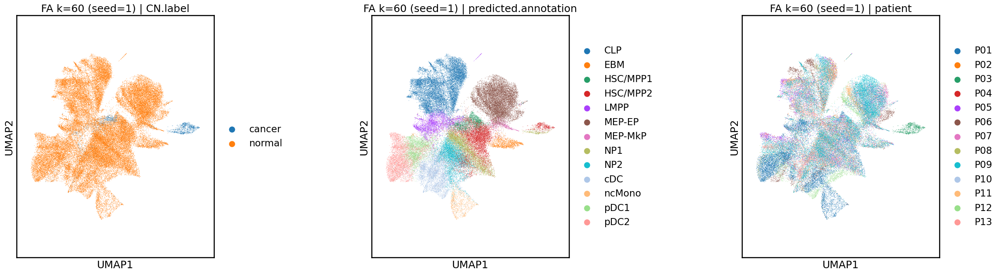

In [12]:
# FA UMAP (existing run has complete k=60)
ad_lat_fa = plot_umap_from_latent(method="fa", k=60, seed=1)

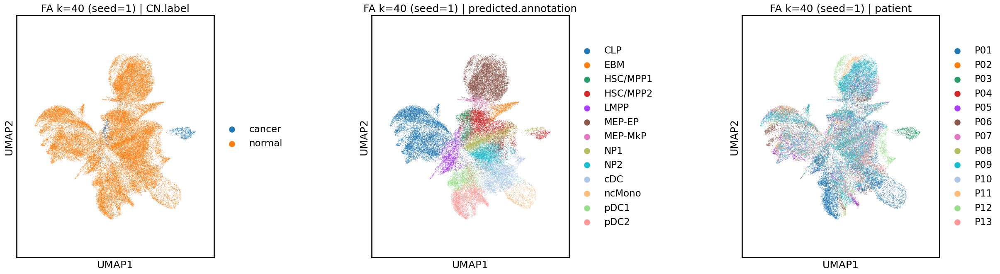

In [13]:
# FA UMAP (existing run has complete k=60)
ad_lat_fa = plot_umap_from_latent(method="fa", k=40, seed=1)

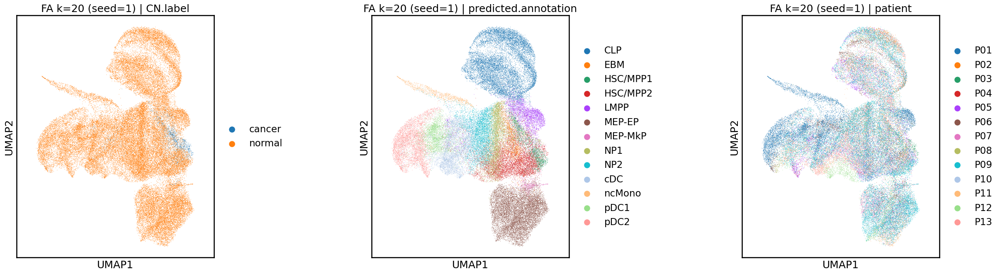

In [14]:
# FA UMAP (existing run has complete k=60)
ad_lat_fa = plot_umap_from_latent(method="fa", k=20, seed=1)

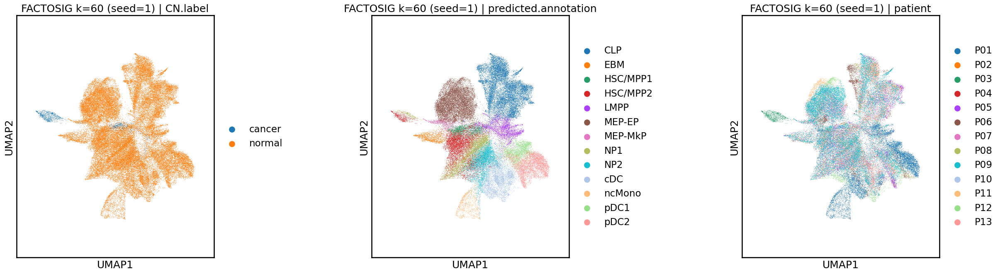

In [15]:
# FactoSig UMAP (existing run has complete k=60)
ad_lat_factosig = plot_umap_from_latent(method="factosig", k=60, seed=1)


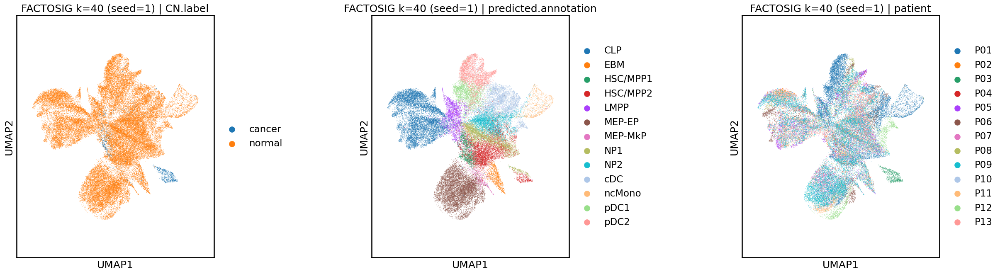

In [16]:
# FactoSig UMAP (existing run has complete k=60)
ad_lat_factosig = plot_umap_from_latent(method="factosig", k=40, seed=1)

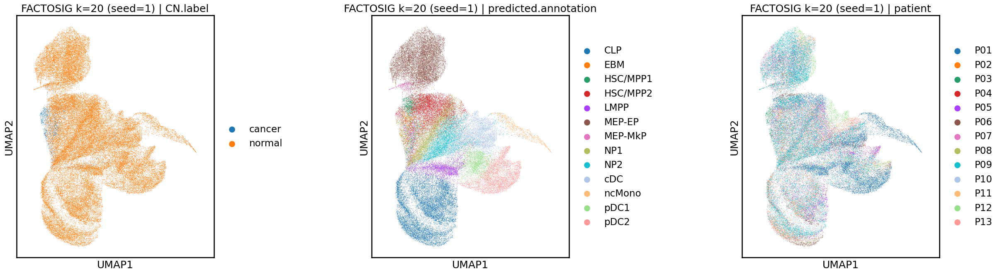

In [17]:
# FactoSig UMAP (existing run has complete k=60)
ad_lat_factosig = plot_umap_from_latent(method="factosig", k=20, seed=1)

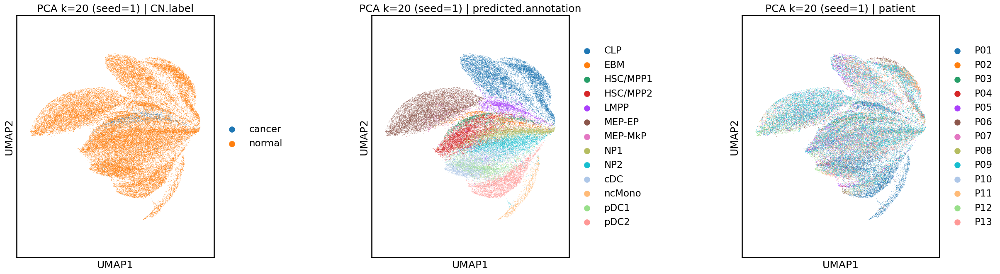

In [18]:
# PCA UMAP (existing run has complete k=60)
ad_lat_pca = plot_umap_from_latent(method="pca", k=20, seed=1)

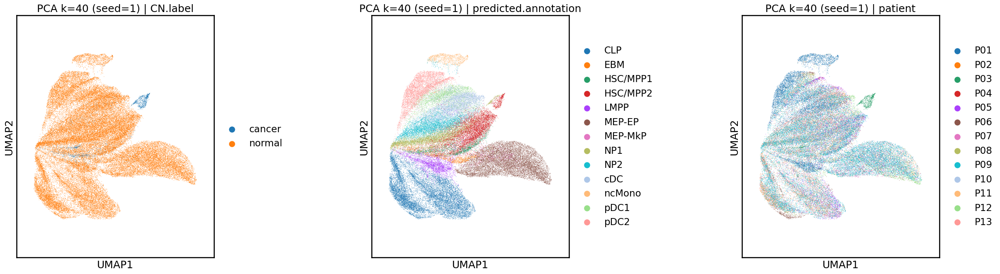

In [19]:
# PCA UMAP (existing run has complete k=60)
ad_lat_pca = plot_umap_from_latent(method="pca", k=40, seed=1)

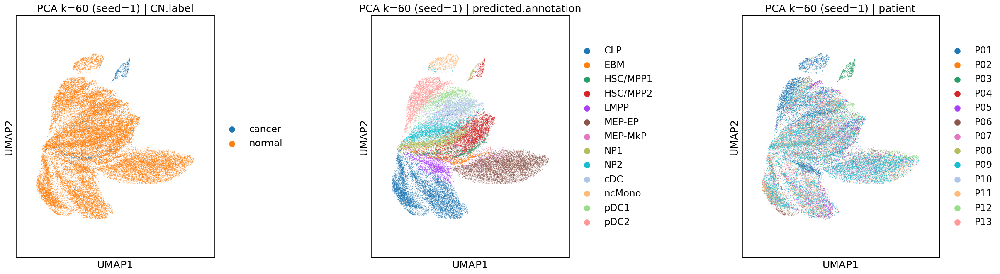

In [20]:
# PCA UMAP (existing run has complete k=60)
ad_lat_pca = plot_umap_from_latent(method="pca", k=60, seed=1)


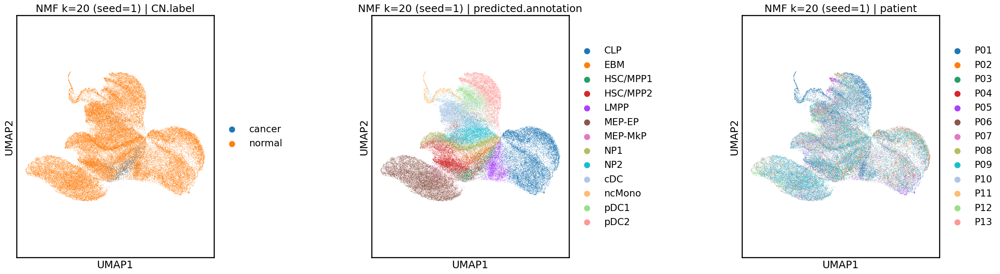

In [21]:
# NMF UMAP (k=20 is the complete one in the current partial run)
ad_lat_nmf = plot_umap_from_latent(method="nmf", k=20, seed=1)
